<a href="https://colab.research.google.com/github/98Lorenzo98/EsameCodificadiTesti/blob/main/TesiInfoUmaDeepArtistIdentify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip gdrive/My\ Drive/bestartworkofalltime

Output streaming troncato alle ultime 5000 righe.
  inflating: resized/resized/Henri_Rousseau_61.jpg  
  inflating: resized/resized/Henri_Rousseau_62.jpg  
  inflating: resized/resized/Henri_Rousseau_63.jpg  
  inflating: resized/resized/Henri_Rousseau_64.jpg  
  inflating: resized/resized/Henri_Rousseau_65.jpg  
  inflating: resized/resized/Henri_Rousseau_66.jpg  
  inflating: resized/resized/Henri_Rousseau_67.jpg  
  inflating: resized/resized/Henri_Rousseau_68.jpg  
  inflating: resized/resized/Henri_Rousseau_69.jpg  
  inflating: resized/resized/Henri_Rousseau_7.jpg  
  inflating: resized/resized/Henri_Rousseau_70.jpg  
  inflating: resized/resized/Henri_Rousseau_8.jpg  
  inflating: resized/resized/Henri_Rousseau_9.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_1.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_10.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_11.jpg  
  inflating: resized/resized/Henri_de_Toulouse-Lautrec_12.jpg  
  inflati

In [ ]:
from google.colab import files
files.upload()

Saving model_deep_artist_identification.h5 to model_deep_artist_identification.h5


In [ ]:
#download
from google.colab import files
files.download("model_deep_artist_identification.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

In [ ]:
!nvidia-smi

In [ ]:
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from tqdm import tqdm, tqdm_notebook
import random

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#prova
import seaborn as sns

#SEED
from numpy.random import seed
seed(1)

import tensorflow
tf.random.set_seed(1)

In [ ]:
print(os.listdir("/content/"))

['.config', 'artists.csv', 'images', 'gdrive', 'resized', 'sample_data']


In [ ]:
artists = pd.read_csv('/content/artists.csv')
artists.shape

(50, 8)

In [ ]:
# Sort artists by number of paintings
artists = artists.sort_values(by=['paintings'], ascending=False)

# Create a dataframe with artists having more than 200 paintings
#artists_top = artists[artists['paintings'] >= 200].reset_index()
artists_top = artists[artists['paintings'] >= 250].reset_index()
artists_top = artists_top[['name', 'paintings']]
#artists_top['class_weight'] = max(artists_top.paintings)/artists_top.paintings
artists_top['class_weight'] = artists_top.paintings.sum() / (artists_top.shape[0] * artists_top.paintings)
artists_top

,name,paintings,class_weight
0,Vincent van Gogh,877,0.462942
1,Edgar Degas,702,0.578348
2,Pablo Picasso,439,0.924829
3,Pierre-Auguste Renoir,336,1.208333
4,Albrecht Dürer,328,1.237805
5,Paul Gauguin,311,1.305466
6,Francisco Goya,291,1.395189
7,Rembrandt,262,1.549618
8,Alfred Sisley,259,1.567568
9,Titian,255,1.592157


In [ ]:
# Set class weights - assign higher weights to underrepresented classes
class_weights = artists_top['class_weight'].to_dict()
class_weights

{0: 0.4629418472063854,
 1: 0.5783475783475783,
 2: 0.9248291571753986,
 3: 1.2083333333333333,
 4: 1.2378048780487805,
 5: 1.3054662379421222,
 6: 1.395189003436426,
 7: 1.549618320610687,
 8: 1.5675675675675675,
 9: 1.592156862745098}

In [ ]:
# There is some problem recognizing 'Albrecht_Dürer' (don't know why, worth exploring)
# So I'll update this string as directory name to df's
updated_name = "Albrecht_DuтХа├кrer".replace("_"," ")
#provare
#updated_name = "Albrecht_DuтХа├кrer".replace("Albrecht_Dürer"," ")
#updated_name = "Albrecht_DuтХа├кrer".replace(" ","Albrecht_Dürer ")
#4riga 1 colonna
artists_top.iloc[4, 0] = updated_name



In [ ]:
# Explore images of top artists
images_dir = '/content/images/images'
artists_dirs = os.listdir(images_dir)
artists_top_name = artists_top['name'].str.replace(' ', '_').values

# See if all directories exist
for name in artists_top_name:
    if os.path.exists(os.path.join(images_dir, name)):
        print("Found -->", os.path.join(images_dir, name))
    else:
        print("Did not find -->", os.path.join(images_dir, name))

Found --> /content/images/images/Vincent_van_Gogh
Found --> /content/images/images/Edgar_Degas
Found --> /content/images/images/Pablo_Picasso
Found --> /content/images/images/Pierre-Auguste_Renoir
Found --> /content/images/images/Albrecht_DuтХа├кrer
Found --> /content/images/images/Paul_Gauguin
Found --> /content/images/images/Francisco_Goya
Found --> /content/images/images/Rembrandt
Found --> /content/images/images/Alfred_Sisley
Found --> /content/images/images/Titian


In [ ]:
#PROVA

import os
import random
from PIL import Image

path = '/content/images/images/Albrecht_DuтХа├кrer'  # in case the folder is in the same directory as the script
files = os.listdir(path)  # listdir gives you a list with all filenames in the provided path.
randomFile = random.choice(files)  # random.choice then selects a random file from your list
print(randomFile) #  prints the random filename

image = Image.open(path + '/' + randomFile)  # displayed the image
image.show()

Albrecht_DuтХа├кrer_142.jpg


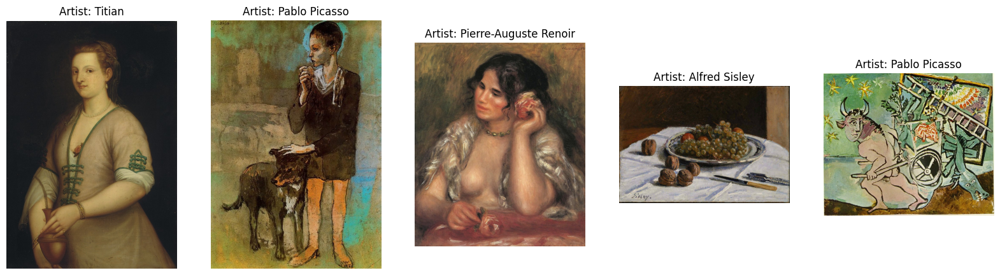

In [ ]:
# Print few random paintings
n = 5

#The subplot() function takes three arguments that describes the layout of the figure.
#The layout is organized in rows and columns, which are represented by the first and second argument.
#The third argument represents the index of the current plot.
fig, axes = plt.subplots(1, n, figsize=(20,10))

for i in range(n):
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)
    image = plt.imread(random_image_file)
    axes[i].imshow(image)
    axes[i].set_title("Artist: " + random_artist.replace('_', ' '))
    axes[i].axis('off')

plt.show()

In [ ]:
len(artists_top_name)

10

In [ ]:
#prova
for i in artists_top_name:
  print (i)

Vincent_van_Gogh
Edgar_Degas
Pablo_Picasso
Pierre-Auguste_Renoir
Albrecht_DuтХа├кrer
Paul_Gauguin
Francisco_Goya
Rembrandt
Alfred_Sisley
Titian


In [ ]:
# Augment data


#directory: path where there exists a folder, under which all the test images are present. For example, in this case, the images are found in /test/test_images/
#batch_size: Set this to some number that divides your total number of images in your test set exactly.
#set the “batch_size” in both train and valid generators to some number that divides your total number of images in your train set and valid respectively,
# but this doesn’t matter before because even if batch_size doesn’t match the number of samples in the train or valid sets and some images gets missed out every time we yield the images from generator,
#it would be sampled the very next epoch you train.
#But for the test set, you should sample the images exactly once, no less or no more. If Confusing, just set it to 1(but maybe a little bit slower).
#class_mode: Set this to None, to return only the images.
#shuffle: Set this to False, because you need to yield the images in “order”, to predict the outputs and match them with their unique ids or filenames.
#Batchsize
#Il numero di esempi contenuti in ogni batch è chiamato batch size.
#Da cui deriva la definizione di iterazione che corrisponde al numero di batch necessari a completare un epoch.
#Facciamo un esempio: abbiamo un training set di 2.000 esempi, troppo grande per essere elaborato in una volta sola.
#Decidiamo quindi di suddividere il training set in batch con 500 esempi ciascuno.
#Avremo quindi che 1 epoch è formata da 4 iterazioni.
#Il numero di epoch ed il batch size influiscono sulla velocità di addestramento di un modello, ma anche sul suo modo di perfezionarsi


batch_size = 16
train_input_shape = (224, 224, 3)
n_classes = artists_top.shape[0]


train_datagen = ImageDataGenerator(validation_split=0.2,
                                   rescale=1./255.,
                                   #rotation_range=45,
                                   #width_shift_range=0.5,
                                   #height_shift_range=0.5,
                                   shear_range=5,
                                   #zoom_range=0.7,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                  )

train_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="training",
                                                    shuffle=True,
                                                    classes=artists_top_name.tolist()

                                                   )

valid_generator = train_datagen.flow_from_directory(directory=images_dir,
                                                    class_mode='categorical',
                                                    target_size=train_input_shape[0:2],
                                                    batch_size=batch_size,
                                                    subset="validation",
                                                    shuffle=True,
                                                    classes=artists_top_name.tolist()

                                                   )

STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
print("Total number of batches =", STEP_SIZE_TRAIN, "and", STEP_SIZE_VALID)

#prova
num_images = valid_generator.n
print("Number of images in the validation generator:", num_images)

Found 3252 images belonging to 10 classes.
Found 808 images belonging to 10 classes.
Total number of batches = 203 and 50
Number of images in the validation generator: 808


In [ ]:
artists_top_name

array(['Vincent_van_Gogh', 'Edgar_Degas', 'Pablo_Picasso',
       'Pierre-Auguste_Renoir', 'Albrecht_DuтХа├кrer', 'Paul_Gauguin',
       'Francisco_Goya', 'Rembrandt', 'Alfred_Sisley', 'Titian'],
      dtype=object)

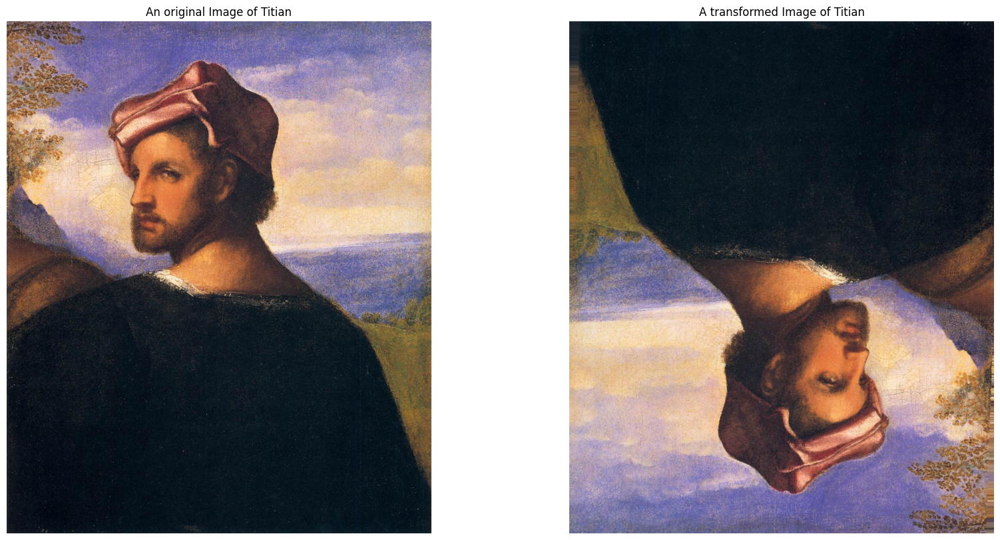

In [ ]:
# Print a random paintings and it's random augmented version
fig, axes = plt.subplots(1, 2, figsize=(20,10))

random_artist = random.choice(artists_top_name)
random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
random_image_file = os.path.join(images_dir, random_artist, random_image)

# Original image
image = plt.imread(random_image_file)
axes[0].imshow(image)
axes[0].set_title("An original Image of " + random_artist.replace('_', ' '))
axes[0].axis('off')

# Transformed image
aug_image = train_datagen.random_transform(image)
axes[1].imshow(aug_image)
axes[1].set_title("A transformed Image of " + random_artist.replace('_', ' '))
axes[1].axis('off')

plt.show()

In [ ]:
#ResNet-50 is a 50-layer convolutional neural network (48 convolutional layers, one MaxPool layer, and one average pool layer).
#Residual neural networks are a type of artificial neural network (ANN) that forms networks by stacking residual blocks.
#The ResNet architecture follows two basic design rules. First, the number of filters in each layer is the same depending on the size of the output feature map.
#Second, if the feature map’s size is halved(dimezzato), it has double the number of filters to maintain the time complexity of each layer.

#The 50-layer ResNet uses a bottleneck design for the building block. A bottleneck residual block uses 1×1 convolutions, known as a “bottleneck”,
#which reduces the number of parameters and matrix multiplications.
#ResNet-50 è una rete neurale convoluzionale con 50 livelli di profondità. È possibile caricare una versione preaddestrata della rete,
#addestrata su oltre un milione di immagini del database di ImageNet [1].
#La rete preaddestrata è in grado di classificare le immagini in 1000 categorie di oggetti, come tastiera, mouse, matita e molti animali.
#Di conseguenza, la rete ha appreso rappresentazioni ricche di feature per un'ampia gamma di immagini. La rete ha una dimensione di input dell'immagine di 224x224.
#This enables much faster training of each layer. It uses a stack of three layers rather than two layers.

#The 50-layer ResNet architecture includes the following elements, as shown in the table below:
#A convolution is the simple application of a filter to an input that results in an activation.
#Repeated application of the same filter to an input results in a map of activations called a feature map,
#indicating the locations and strength of a detected feature in an input, such as an image.
#Average Pooling Layer
#Average pooling involves calculating the average for each patch of the feature map.
#Convolutional layers in a convolutional neural network systematically apply learned filters to input images
#in order to create feature maps that summarize the presence of those features in the input.
#Average Pooling: Calculate the average value for each patch on the feature map.
#Maximum Pooling (or Max Pooling): Calculate the maximum value for each patch of the feature map.

#A 7×7 kernel convolution alongside 64 other kernels with a 2-sized stride.
#A max pooling layer with a 2-sized stride.
#9 more layers—3×3,64 kernel convolution, another with 1×1,64 kernels, and a third with 1×1,256 kernels. These 3 layers are repeated 3 times.
#12 more layers with 1×1,128 kernels, 3×3,128 kernels, and 1×1,512 kernels, iterated 4 times.
#18 more layers with 1×1,256 cores, and 2 cores 3×3,256 and 1×1,1024, iterated 6 times.
#9 more layers with 1×1,512 cores, 3×3,512 cores, and 1×1,2048 cores iterated 3 times.
#Average pooling, followed by a fully connected layer with 1000 nodes, using the softmax activation function.


#Import the Pre-trained Model
#The keras library comes with many cutting-edge machine learning algorithms that users can choose to solve a problem.
#This tutorial selects the ResNet-50 model to use transfer learning and create a classifier.

#Setting include_top to False means it will allow adding input and output layers custom to a problem.
#The weights parameter specifies that the model uses its weights while training on the imagenet dataset.
#The for loop on the model’s layers ensures it doesn’t learn its weights again and saves on time and space.

#prova

#2. Use the following commands to add a fully connected output layer to the model where the learning can happen:
#demo_resnet_model.add(Flatten())
#demo_resnet_model.add(Dense(512, activation='relu'))
#demo_resnet_model.add(Dense(5, activation='softmax'))
#The above code uses the softmax function and creates five neurons to classify the five flower classes in the dataset.
#If you want to train a classifier, any classifier, the initial layers are going to detect slant lines no matter what you want to classify.
# Hence, it does not make sense to train them every time you create a neural network.
#It is only the final layers of our network, the layers that learn to identify classes specific to your project that need training.
#Hence what we do is, we take a Resnet34, and remove its final layers. We then add some layers of our own to it (randomly initialized) and train this new model.
#Before we look at how we do this in code, I’d like to mention that pretrained models are usually trained on large amounts of data and using resources that aren’t usually available to everyone.
#Take ImageNet for example. It contains over 14 million images with 1.2 million of them assigned to one of a 1000 categories. Hence it would be really beneficial for us to use these models.
#We do so because the weights of these layers are initialized to random values and need more training than the ResNet layers. Hence we freeze the ResNet and only train the rest of the network.
#Once we’ve trained the last layers a little, we can unfreeze the layers of Resnet34. We then find a good learning rate for the whole model and train it.
#fineprova
#specificando l'argomento include_top=False , carichi una rete che non include i livelli di classificazione nella parte superiore, il che è l'ideale per l'estrazione di funzionalità.
#È importante bloccare la base convoluzionale prima di compilare e addestrare il modello. Il congelamento (impostando layer.trainable = False)
# impedisce l'aggiornamento dei pesi in un determinato livello durante l'allenamento

# Load pre-trained model
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=train_input_shape)
#base_model =MobileNetV2(weights='imagenet', include_top=False, input_shape=train_input_shape)

for layer in base_model.layers:
    layer.trainable = True

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
# Add layers at the end

X = base_model.output

#flattening is used to reduce the dimensionality of the input to a layer. A dense layer expects a row vector (which again, mathematically is a multidimensional object still),
#where each column corresponds to a feature input of the dense layer, so basically a convenient equivalent of Numpy's
#he role of the Flatten layer in Keras is super simple:
#A flatten operation on a tensor reshapes the tensor to have the shape that is equal to the number of elements contained in tensor non including the batch dimension.
#Flattening a tensor means to remove all of the dimensions except for one.
#A Flatten layer in Keras reshapes the tensor to have a shape that is equal to the number of elements contained in the tensor.
#This is the same thing as making a 1d-array of elements.
#Flattern layers are often used before a fully connected layer
#we want to convert images or other multi-dimensional data into one-dimensional linear tensors or vectors that can be used as inputs to the next layer of a neural network
#(say, artificial neural networks, or ANNs).
#In convolutional neural networks (CNNs), 'we flatten the output of the convolutional layers to create a single long feature vector.
#And it is connected to the final classification model, which is called a fully-connected layer.
#In other words, we put all the pixel data in one line and make connections with the final layer.' [1]
#Flatten will take a tensor of any shape and transform it into a one dimensional tensor (plus the samples dimension)
#but keeping all values in the tensor. For example a tensor (samples, 10, 20, 1) will be flattened to (samples, 10 * 20 * 1).
#The Flatten layer will always have at least as much parameters as the GlobalAveragePooling2D layer.
#If the final tensor shape before flattening is still large, for instance (16, 240, 240, 128),
#using Flatten will make an insane amount of parameters: 240*240*128 = 7,372,800. This huge number will be multiplied by the number of units in your next dense layer



X = Flatten()(X)

#A Dense layer feeds all outputs from the previous layer to all its neurons, each neuron providing one output to the next layer.
#It's the most basic layer in neural networks.
#A Dense(10) has ten neurons. A Dense(512) has 512 neurons.
#Tuning just means trying different combinations of parameters and keep the one with the lowest loss value or better accuracy on the validation set, depending on the problem.
#There are two basic methods:

#Grid search: For each parameter, decide a range and steps into that range, like 8 to 64 neurons,
#in powers of two (8, 16, 32, 64), and try each combination of the parameters. This is obviously requires an exponential number of models to be trained and tested and takes a lot of time.

#Random search: Do the same but just define a range for each parameter and try a random set of parameters,
#drawn from an uniform distribution over each range. You can try as many parameters sets you want, for as how long you can. This is just a informed random guess.

#Unfortunately there is no other way to tune such parameters. About layers having different number of neurons,
#that could come from the tuning process, or you can also see it as dimensionality reduction, like a compressed version of the previous layer.



#X = Dense(512, kernel_initializer='he_uniform')(X)
#X = Dense(64, kernel_initializer='he_uniform')(X)
#X = Dropout(0.5)(X)


#Batch normalization (also known as batch norm) is
# a method used to make training of artificial neural networks faster and more stable through normalization of the layers' inputs by re-centering and re-scaling
#Batch Norm is just another network layer that gets inserted between a hidden layer and the next hidden layer.
#Its job is to take the outputs from the first hidden layer and normalize them before passing them on as the input of the next hidden layer.
#Batch normalization applies a transformation that maintains the mean output close to 0 and the output standard deviation close to 1.

#X = BatchNormalization()(X)

#relu rectifided linear unit
#relu(x)=max(0,x) map negative value to 0 and when past positivie value, will map positive value to the value itself

#X = Activation('relu')(X)


#the neural network needs to start with some weights and then iteratively update them to better values. The term kernel_initializer is a fancy
#term for which statistical distribution or function to use for initialising the weights. In case of statistical distribution,
#the library will generate numbers from that statistical distribution and use as starting weights.

#16 is column numbers ,it must take that as input data (well python counts from 0 by the way).
#then right after this "Dense(" comes "32" , this 32 is classes you want to categorize your data.
#model = Sequential()
#model.add(Dense(input_layer_neurons=16, hidden_layer_neurons=32, kernel_initializer='normal', activation='relu'))

#prova
#You create a new node in the graph of layers by calling a layer on this inputs object:
#dense = layers.Dense(64, activation="relu")
#x = dense(inputs)

#The "layer call" action is like drawing an arrow from "inputs" to this layer you created. You're "passing" the inputs to the dense layer, and you get x as the output.

#Let's add a few more layers to the graph of layers:
#x = layers.Dense(64, activation="relu")(x)
#outputs = layers.Dense(10)(x)
#fineprova

#https://www.tensorflow.org/guide/keras/functional_api

#layer dense ogni neurone di un layer è connesso a un neurone di un layer successivo attraverso un peso
#16 neuroni
#Dense is the only actual network layer in that model.
#A Dense layer feeds all outputs from the previous layer to all its neurons, each neuron providing one output to the next layer.
#It's the most basic layer in neural networks.
#A Dense(10) has ten neurons. A Dense(512) has 512 neurons.

#Kernel_initializers play a crucial role in training Deep Learning models. They define the distribution of weights and biases,
#which can significantly impact a model's accuracy and speed of convergence.

X = Dense(16, kernel_initializer='he_uniform')(X)
#X = Dropout(0.5)(X)

#Batch Normalization will help with covariance shift and as you are training on new data batch-wise, it would be a good thing for the network.
#There is nothing as too much BatchNormalization, just put after every layer that is having activations in it.
#The general use case is to use BN between the linear and non-linear layers in your network, because it normalizes the input to your activation function,
#so that you're centered in the linear section of the activation function (such as Sigmoid)
#Batch normalization scales layers outputs to have mean 0 and variance 1. The outputs are scaled such a way to train the network faster.
#It also reduces problems due to poor parameter initialization
#Specifically, batch normalization normalizes the output of a previous layer by subtracting the batch mean and dividing by the batch standard deviation
#Batch Norm is a normalization technique done between the layers of a Neural Network instead of in the raw data. It is done along mini-batches instead of the full data set.
#It serves to speed up training and use higher learning rates, making learning easier.
#is applied to the neurons’ output just before applying the activation function
#The internal covariate shift is a change in the input distribution of an internal layer of a Neural Network.
# For the neurons in an internal layer, the inputs received (from the previous layer) are constantly changing.
# This is due to the multiple computations done before it and the weights over the training process.
#Applying Batch Norm ensures that the mean and standard deviation of the layer inputs will always remain the same
#ensures that the mean and standard deviation of the layer inputs will always remain the same; \beta and \gamma, respectively.
# Thus, the amount of change in the distribution of the input of layers is reduced.
# The deeper layers have a more robust ground on what the input values are going to be, which helps during the learning process.
#Lastly, it seems that Batch Norm has a regularization effect.  Because it is computed over mini-batches and not the entire data set,
#the model’s data distribution sees each time has some noise.
#This can act as a regularizer, which can help overcome overfitting and help learn better
#Covariate shift in machine learning is a type of model drift which occurs when the distribution of independent variables changes between the training environment and live environment.
#There are many different types of dataset drift including covariate drift. Other examples include concept shift, which is the changing in relationship between the input and target output.
# Like all model drift, covariate drift can happen gradually over time or suddenly
X = BatchNormalization()(X)
#An activation function in a neural network defines how the weighted sum of the input is transformed into an output from a node or nodes in a layer of the network.
#The softmax function generates a probability distribution over the classes, while ReLU just gives a value between zero and the given input
#relu
#The function returns 0 if it receives any negative input, but for any positive value x it returns that value back
#The modern default activation function for hidden layers is the ReLU function.
#An activation function in a neural network defines how the weighted sum of the input is transformed into an output from a node or nodes in a layer of the network
#A network may have three types of layers: input layers that take raw input from the domain, hidden layers that take input from another layer and pass output to another layer,
# and output layers that make a prediction.
#All hidden layers typically use the same activation function. The output layer will typically use a different activation function from the hidden layers
#and is dependent upon the type of prediction required by the model
#A hidden layer in a neural network is a layer that receives input from another layer (such as another hidden layer or an input layer)
# and provides output to another layer (such as another hidden layer or an output layer).
#ReLU Hidden Layer Activation Function
# Specifically, it is less susceptible to vanishing gradients that prevent deep models from being trained
#The ReLU function is calculated as follows: max(0.0, x) .This means that if the input value (x) is negative, then a value 0.0 is returned, otherwise, the value is returned
#When using the ReLU function for hidden layers, it is a good practice to use a “He Normal” or “He Uniform” weight initialization
# and scale input data to the range 0-1 (normalize) prior to training.
X = Activation('relu')(X)


#Softmax converts a vector of values to a probability distribution.
#The elements of the output vector are in range (0, 1) and sum to 1.
#Each vector is handled independently. The axis argument sets which axis of the input the function is applied along.
#Softmax is often used as the activation for the last layer of a classification network because the result could be interpreted as a probability distribution.
#The softmax of each vector x is computed as exp(x) / tf.reduce_sum(exp(x)).
#The input values in are the log-odds of the resulting probability.
#The softmax function is used as the activation function in the output layer of neural network models that predict a multinomial probability distribution.
#That is, softmax is used as the activation function for multi-class classification problems where class membership is required on more than two class labels.

output = Dense(n_classes, activation='softmax')(X)

#imput
#In Keras, the input layer itself is not a layer, but a tensor. It's the starting tensor you send to the first hidden layer. This tensor must have the same shape as your training data.
#Example: if you have 30 images of 50x50 pixels in RGB (3 channels), the shape of your input data is (30,50,50,3). Then your input layer tensor, must have this shape

model = Model(inputs=base_model.input, outputs=output)

In [ ]:
#optimizer = Adam(lr=0.0001)
optimizer = Adam(learning_rate=0.0001)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

In [ ]:
n_epoch = 10


#Early Stopping is a famous and very effective regularization strategy designed to avoid or reduce overfitting
#in machine learning models. As its name suggests, early stopping interrupts the training when it detects that the model is losing its performance.
#There is no problem at all with using EarlyStopping. In real-world projects, I recommend using EarlyStopping always as possible because
#(1) EarlyStopping reduces the chance of your model get over fitted and
#(2) EarlyStopping reduces your waiting time.

#In addition, because of restore_best_weight = True, this time EarlyStopping will restore the model weights for the best fit:
# the weights when the training achieved the best score (minimum val_loss in our example).
#Note that we are setting restore_best_weight = True because we want to keep the best weight in the training end.

early_stop = EarlyStopping(monitor='val_loss', patience=20, verbose=1,
                           mode='auto', restore_best_weights=True)

#mode=min: lr will be reduced when the quantity monitored has stopped decreasing
#factor: factor by which the learning rate will be reduced
#patience: number of epochs with no improvement after which learning rate will be reduced
#threshold: threshold for measuring the new optimum, to only focus on significant changes (change value). Say we have threshold=0.0001,
# if loss is 18.0 on epoch n and loss is 17.9999 on epoch n+1 then we have met our criteria to multiply the current learning rate by the factor.
# A large learning rate can miss the global minimum and in extreme cases can cause the model to diverge completely from the optimal solution.
#On the other hand, a small learning rate can stuck to a local minimum.
#ReduceLROnPlateau purpose is to track your model's performance and reduce the learning rate when there is no improvement for x number of epochs

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5,
                              verbose=1, mode='auto')

In [ ]:
#workers: Integer. Used for generator or keras.utils.Sequence input only. Maximum number of processes to spin up when using process-based threading. If unspecified, workers will default to 1.
#use_multiprocessing: Boolean. Used for generator or keras.utils.Sequence input only. If True, use process-based threading. If unspecified, use_multiprocessing will default to False.
#Note that because this implementation relies on multiprocessing, you should not pass non-picklable arguments to the generator as they can't be passed easily to children processes.
#epoch
#Il numero di epoch è un iperparametro che definisce il numero di volte in cui l'algoritmo di apprendimento funzionerà attraverso l'intero set di dati di addestramento.
#La dimensione del batch è il numero di campioni elaborati prima dell'aggiornamento del modello mentre il numero di epoch è quante volte l'algoritmo deve usare il set di dati di addestramento.



# Train the model - all layers
history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
#history1 = model.fit(train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1,
                              callbacks=[reduce_lr],
                              use_multiprocessing=True,
                              workers=16,
                              class_weight=class_weights
                             )

<ipython-input-21-701ca807fbcf>:11: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Epoch 1/10
203/203 [==============================] - 152s 470ms/step - loss: 1.4772 - accuracy: 0.4691 - val_loss: 2.9949 - val_accuracy: 0.2175 - lr: 1.0000e-04
Epoch 2/10
203/203 [==============================] - 95s 450ms/step - loss: 1.0772 - accuracy: 0.6653 - val_loss: 3.3857 - val_accuracy: 0.0688 - lr: 1.0000e-04
Epoch 3/10
203/203 [==============================] - 97s 453ms/step - loss: 0.9078 - accuracy: 0.7590 - val_loss: 2.5851 - val_accuracy: 0.0850 - lr: 1.0000e-04
Epoch 4/10
203/203 [==============================] - 95s 450ms/step - loss: 0.7844 - accuracy: 0.8146 - val_loss: 2.7129 - val_accuracy: 0.2262 - lr: 1.0000e-04
Epoch 5/10
203/203 [==============================] - 95s 452ms/step - loss: 0.6816 - accuracy: 0.8504 - val_loss: 1.4930 - val_accuracy: 0.5425 - lr: 1.0000e-04
Epoch 6/10
203/203 [==============================] - 94s 443ms/step - loss: 0.6190 - accuracy: 0.8724 - val_loss: 0.9717 - val_accuracy: 0.7887 - lr: 1.0000e-04
Epoch 7/10
203/203 [=======

In [ ]:
#Here we include_top=False so we only have a convolution layer and we are freezing the starting 8 layers by making layer.trainable = ‘False’
#to freeze some layer
#for layer in model.layers[:8]:
    #layer.trainable = False



# Freeze core ResNet layers and train again
for layer in model.layers:
    layer.trainable = False

#Unfreeze those layers you want to train (in this case, model.layers[:50])

#resnet50
for layer in model.layers[:50]:
#for layer in model.layers[:30]:
#mobilentv2 MobileNet-v2 una rete neurale convoluzionale con 53 livelli di profondità.
#for layer in model.layers[:53]:
    layer.trainable = True

optimizer = Adam(lr=0.0001)

model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])

#n_epoch = 50
n_epoch=30
history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator, validation_steps=STEP_SIZE_VALID,
                              epochs=n_epoch,
                              shuffle=True,
                              verbose=1,
                              callbacks=[reduce_lr, early_stop],
                              use_multiprocessing=True,
                              workers=16,
                              class_weight=class_weights
                             )

<ipython-input-22-cbb2a11ee598>:29: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2 = model.fit_generator(generator=train_generator, steps_per_epoch=STEP_SIZE_TRAIN,


Epoch 1/30
203/203 [==============================] - 106s 437ms/step - loss: 0.3696 - accuracy: 0.9184 - val_loss: 1.9914 - val_accuracy: 0.3537 - lr: 0.0010
Epoch 2/30
203/203 [==============================] - 95s 449ms/step - loss: 0.3056 - accuracy: 0.9354 - val_loss: 1.9212 - val_accuracy: 0.3988 - lr: 0.0010
Epoch 3/30
203/203 [==============================] - 109s 518ms/step - loss: 0.2859 - accuracy: 0.9407 - val_loss: 1.2585 - val_accuracy: 0.6175 - lr: 0.0010
Epoch 4/30
203/203 [==============================] - 94s 443ms/step - loss: 0.2386 - accuracy: 0.9515 - val_loss: 1.7534 - val_accuracy: 0.4400 - lr: 0.0010
Epoch 5/30
203/203 [==============================] - 91s 426ms/step - loss: 0.2064 - accuracy: 0.9552 - val_loss: 0.9844 - val_accuracy: 0.7200 - lr: 0.0010
Epoch 6/30
203/203 [==============================] - 93s 442ms/step - loss: 0.1869 - accuracy: 0.9570 - val_loss: 2.0175 - val_accuracy: 0.4437 - lr: 0.0010
Epoch 7/30
203/203 [==============================

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
#overfitting
#In caso l’accuracy calcolata sul training set tenda ad avvicinarsi ad 1, mentre l’accuracy calcolata sul validation set o sul test set tenda ad allontanarsi da 1,
#allora il modello è in overfitting.
#In pratica è come se il modello, piuttosto che imparare le regole generali di riconoscimento dei pattern, avesse imparato a memoria i pattern di esempio,
# di fatto riconoscendo molto bene quelli già visti, ma andando in errore facilmente con i pattern non ancora visionati.
#casue principali
#il training set è troppo piccolo o poco vario, quindi il modello non riesce a trovare una regola sufficientemente generalizzata
#il modello è troppo complesso, quindi trova più facile “aderire” ai singoli esempi che determinare una regola di riconoscimento generalizzata.
#In caso di overfitting si può intervenire rimodulando gli iperparametri e la complessità del modello o applicando tecniche di dropout,
#aumentando il numero e la varietà degli esempi del training set oppure interrompendo i cicli di addestramento arrivando alla epoch in cui l’accuracy del validation set inizia a ridiscendere
#In quest’ultimo caso, la epoch in cui si interrompe l’addestramento è chiamata early stopping epoch
#e denota il punto di addestramento migliore ottenibile con quel training set e quella configurazione del modello.

#ACCURACY
#Essa non fa altro che indicarci quante volte il nostro modello ha correttamente classificato un item nel nostro dataset rispetto al totale.

#Infatti la formula per l'accuratezza è la divisione tra numero di risposte corrette e il totale delle risposte
#accuratezza= numero_risposte_corrette/numero_risposte_totali
#La accuratezza tiene conto delle performance del modello in senso stretto. Vale a dire che non ci permette di comprendere il contesto nel quale stiamo operando.
#Presa fuori dal contesto, la accuratezza è una metrica molto delicata da interpretare.
#Ad esempio, è sconsigliato usare la accuratezza come metrica di valutazione quando operiamo con un dataset sbilanciato, dove le classi sono distribuite in maniera impari.
#Se la accuratezza non è altro che il rapporto tra risposte corrette sul totale, allora capirete che se una classe compone il 90% del nostro dataset e il nostro modello (erroneamente)
#classifica ogni esempio nel dataset con quella classe specifica, allora la sua accuratezza sarà del 90%

#precision
#La precisione non è altro che la accuratezza calcolata solo classi positive. Essa è anche chiamata specificità poiché definisce quanto sensibile è uno strumento
#quando c'è il segnale da riconoscere.
#Di fatto, la metrica ci informa quanto spesso siamo corretti quando classifichiamo una classe come positiva.
#precisione= TP/TP+FP

#RECALL
#recall invece rappresenta l'altro ago della bilancia. Se siamo interessati a riconoscere quanti più classi positive possibili, allora il nostro modello dovrà avere un richiamo alto
#recall= TP/TP+FN
#In pratica significa che qui dobbiamo tener conto dei falsi negativi invece dei falsi positivi. Il richiamo viene anche chiamato sensibilità perché all'aumentare del richiamo,
# il nostro modello diventa sempre meno preciso e classifica anche classi negative come positive.

#F1 score
#Se il nostro punteggio F1 aumenta, vuol dire che il nostro modello ha aumentato le performance per precisione, richiamo o per entrambi.
# punteggio F1 combina precisione e richiamo in una sola metrica.
#F1=2*(precisione×richiamo/precisione+richiamo)
#Questa è la media armonica di precisione e richiamo, ed è probabilmente la metrica più usata per valutare modelli di classificazione binaria










In [ ]:
# Merge history1 and history2

#A history objects has a history field is a dictionary which helds different training metrics spanned across every training epoch. So e.g. history.history['loss'][99]
#will return a loss of your model in a 100th epoch of training. In order to save that you could pickle this dictionary or simple save different lists from this dictionary to appropriate file.

history = {}
history['loss'] = history1.history['loss'] + history2.history['loss']
history['accuracy'] = history1.history['accuracy'] + history2.history['accuracy']
history['val_loss'] = history1.history['val_loss'] + history2.history['val_loss']
history['val_accuracy'] = history1.history['val_accuracy'] + history2.history['val_accuracy']
history['lr'] = history1.history['lr'] + history2.history['lr']

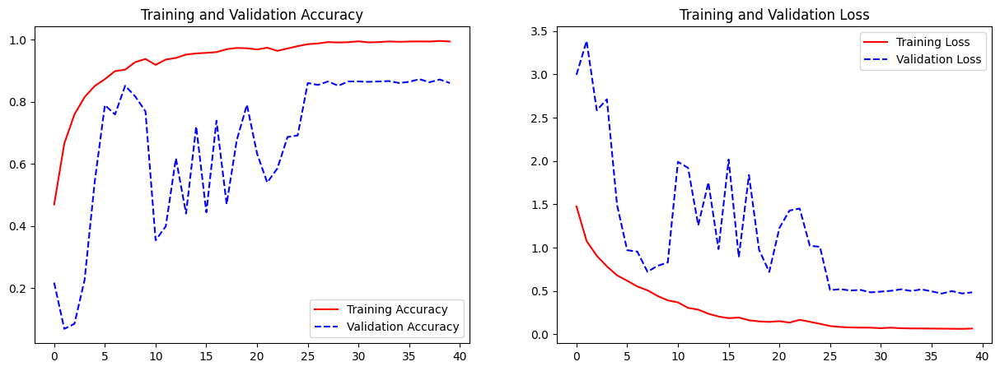

In [ ]:
# Plot the training graph
def plot_training(history):
    acc = history['accuracy']
    val_acc = history['val_accuracy']
    loss = history['loss']
    val_loss = history['val_loss']
    epochs = range(len(acc))

    fig, axes = plt.subplots(1, 2, figsize=(15,5))

    axes[0].plot(epochs, acc, 'r-', label='Training Accuracy')
    axes[0].plot(epochs, val_acc, 'b--', label='Validation Accuracy')
    axes[0].set_title('Training and Validation Accuracy')
    axes[0].legend(loc='best')

    axes[1].plot(epochs, loss, 'r-', label='Training Loss')
    axes[1].plot(epochs, val_loss, 'b--', label='Validation Loss')
    axes[1].set_title('Training and Validation Loss')
    axes[1].legend(loc='best')

    plt.show()

plot_training(history)

In [ ]:
#La loss function (o funzione di costo) è una funzione che valuta le prestazioni di un modello.
#Rappresenta una perdita e quindi l’obiettivo di un buon apprendimento è la minimizzazione della loss function: minore è la loss, migliore è il modello
#La loss viene calcolata sui set di pattern di allenamento e validazione (training e validation set) e quindi è limitata a valutare quanto il modello si sta comportando bene con questi due set.
#E’ un valore numerico che rappresenta una summa degli errori fatti per ogni esempio del training o validation set.

#accuracy
#La accuracy di un modello viene in genere determinata dopo che i suoi parametri sono stati appresi.
#In un sistema di classificazione, ad esempio, i campioni di test vengono forniti al modello e vengono conteggiati gli esempi correttamente elaborati.
# Infine viene calcolata l’accuratezza come rapporto tra i campioni correttamente elaborati e il totale dei campioni inviati al modello.


# Prediction accuracy on train data
score = model.evaluate_generator(train_generator, verbose=1)
print("Prediction accuracy on train data =", score[1])

<ipython-input-26-1019fc591f3a>:13: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(train_generator, verbose=1)


204/204 [==============================] - 63s 308ms/step - loss: 0.0673 - accuracy: 0.9975
Prediction accuracy on train data = 0.9975399971008301


In [ ]:
# Prediction accuracy on CV data
score = model.evaluate_generator(valid_generator, verbose=1)
print("Prediction accuracy on CV data =", score[1])

<ipython-input-27-d4a6d1ee285c>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(valid_generator, verbose=1)


51/51 [==============================] - 16s 313ms/step - loss: 0.4714 - accuracy: 0.8651
Prediction accuracy on CV data = 0.8650990128517151


1/1 [==============================] - 0s 29ms/step


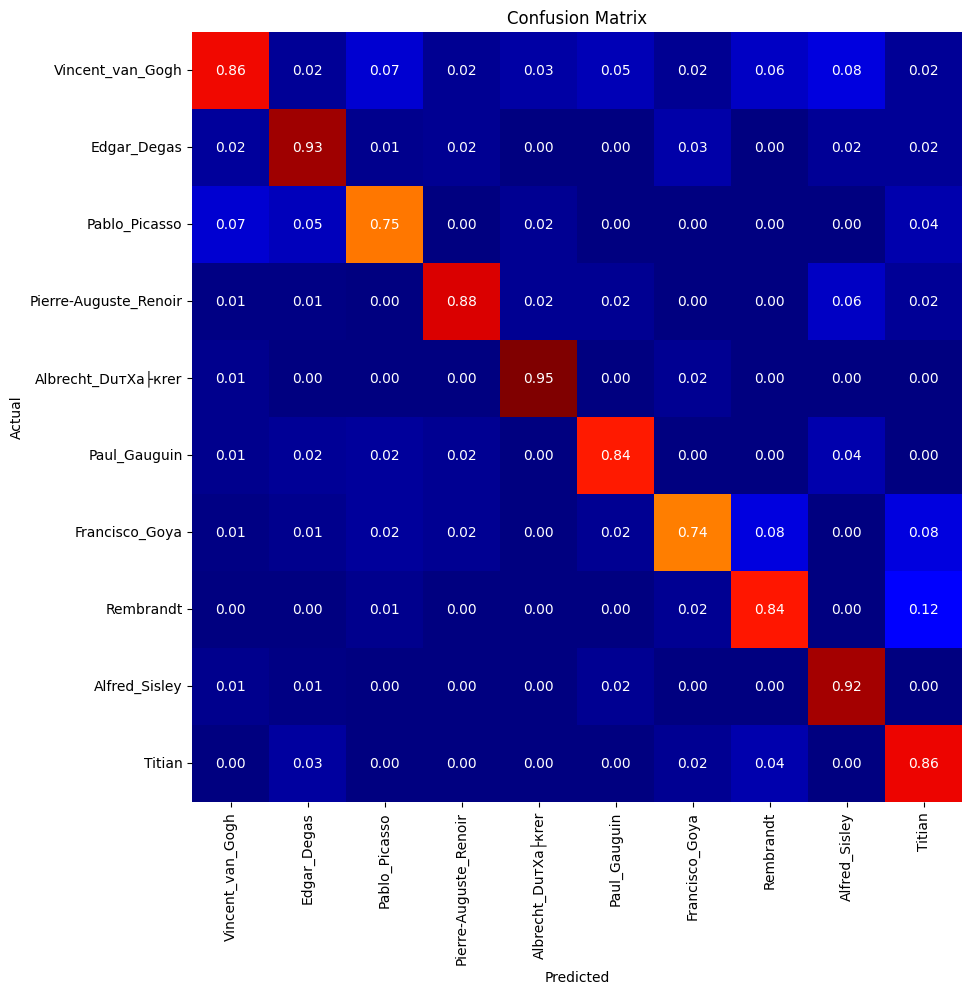

Classification Report:
                       precision    recall  f1-score   support

     Vincent_van_Gogh       0.86      0.86      0.86       172
          Edgar_Degas       0.86      0.93      0.89       138
        Pablo_Picasso       0.84      0.75      0.79        87
Pierre-Auguste_Renoir       0.93      0.88      0.90        65
  Albrecht_DuтХа├кrer       0.94      0.95      0.95        65
         Paul_Gauguin       0.90      0.84      0.87        62
       Francisco_Goya       0.88      0.74      0.80        58
            Rembrandt       0.83      0.84      0.83        51
        Alfred_Sisley       0.82      0.92      0.87        51
               Titian       0.75      0.86      0.80        51

             accuracy                           0.86       800
            macro avg       0.86      0.86      0.86       800
         weighted avg       0.86      0.86      0.86       800



In [ ]:
#Accuracy = Correct Predictions / Total Predictions
#Accuracy is a method for measuring a classification model’s performance. It is typically expressed as a percentage.
#Accuracy is the count of predictions where the predicted value is equal to the true value.  It is binary (true/false) for a particular sample.
#Accuracy is often graphed and monitored during the training phase though the value is often associated with the overall or final model accuracy.  Accuracy is easier to interpret than loss.

#Loss can be seen as a distance between the true values of the problem and the values predicted by the model. Greater the loss is, more huge is the errors you made on the data.
#Accuracy can be seen as the number of error you made on the data.

#There is no relationship between these two metrics.
#Loss can be seen as a distance between the true values of the problem and the values predicted by the model. Greater the loss is, more huge is the errors you made on the data.
#Accuracy can be seen as the number of error you made on the data.
#That means:
#a low accuracy and huge loss means you made huge errors on a lot of data
#a low accuracy but low loss means you made little errors on a lot of data
#a great accuracy with low loss means you made low errors on a few data (best case)


#A loss function, also known as a cost function, takes into account the probabilities or uncertainty of a prediction based on how much the prediction varies from the true value.
#This gives us a more nuanced view into how well the model is performing.
#Unlike accuracy, loss is not a percentage — it is a summation of the errors made for each sample in training or validation sets.
# Loss is often used in the training process to find the "best" parameter values
#for the model (e.g. weights in neural network). During the training process the goal is to minimize this value.

#By using confusion matrix, Accuracy = (TP + TN)/(TP+TN+FP+FN)
#Precision: It is the ratio of True Positives (TP) and the total positive predictions. Basically, it tells us how many times your positive prediction was actually positive.
#In an imbalanced classification problem with more than two classes, precision is calculated as the sum of true positives
#across all classes divided by the sum of true positives and false positives across all classes.
#Precision = Sum c in C TruePositives_c / Sum c in C (TruePositives_c + FalsePositives_c)
#Recall : It is nothing but TPR (True Positive Rate explained above). It tells us about out of all the positive points how many were predicted positive.
#Recall = TruePositives / (TruePositives + FalseNegatives)
#In an imbalanced classification problem with more than two classes, recall is calculated as the sum of true positives
#across all classes divided by the sum of true positives and false negatives across all classes.
#Recall = Sum c in C TruePositives_c / Sum c in C (TruePositives_c + FalseNegatives_c)
#Precision: Appropriate when minimizing false positives is the focus.
#Recall: Appropriate when minimizing false negatives is the focus.
#F-Measure: Harmonic mean of precision and recall.
#F-Measure provides a way to combine both precision and recall into a single measure that captures both properties.
#F-Measure = (2 * Precision * Recall) / (Precision + Recall)

#confusion matrix
#mappa bidimensionale con le classi vere in riga e le classi predette in colonna. Colorando ogni cella in base al rapporto tra classe predetta e classe vera,
# vengono evidenziate zone di confusione dove il modello non si comporta adeguatamente








# Classification report and confusion matrix
from sklearn.metrics import *
import seaborn as sns

tick_labels = artists_top_name.tolist()

def showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID):
    # Loop on each generator batch and predict
    y_pred, y_true = [], []
    for i in range(STEP_SIZE_VALID):
        (X,y) = next(valid_generator)
        y_pred.append(model.predict(X))
        y_true.append(y)

    # Create a flat list for y_true and y_pred
    y_pred = [subresult for result in y_pred for subresult in result]
    y_true = [subresult for result in y_true for subresult in result]

    # Update Truth vector based on argmax
    y_true = np.argmax(y_true, axis=1)
    y_true = np.asarray(y_true).ravel()

    # Update Prediction vector based on argmax
    y_pred = np.argmax(y_pred, axis=1)
    y_pred = np.asarray(y_pred).ravel()

    # Confusion Matrix
    fig, ax = plt.subplots(figsize=(10,10))
    conf_matrix = confusion_matrix(y_true, y_pred, labels=np.arange(n_classes))
    conf_matrix = conf_matrix/np.sum(conf_matrix, axis=1)
    sns.heatmap(conf_matrix, annot=True, fmt=".2f", square=True, cbar=False,
                cmap=plt.cm.jet, xticklabels=tick_labels, yticklabels=tick_labels,
                ax=ax)
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted')
    ax.set_title('Confusion Matrix')
    plt.show()

    print('Classification Report:')
    print(classification_report(y_true, y_pred, labels=np.arange(n_classes), target_names=artists_top_name.tolist()))

showClassficationReport_Generator(model, valid_generator, STEP_SIZE_VALID)

1/1 [==============================] - 0s 23ms/step


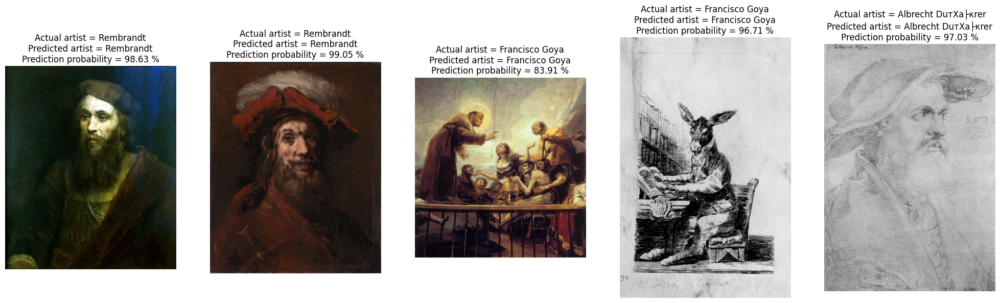

In [ ]:
# Prediction
from keras.preprocessing import *

n = 5
fig, axes = plt.subplots(1, n, figsize=(25,10))

for i in range(n):
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)

    # Original image

    #ERRORE
    #test_image = image.load_img(random_image_file, target_size=(train_input_shape[0:2]))
    test_image = tf.keras.utils.load_img(random_image_file, target_size=(train_input_shape[0:2]))

    # Predict artist
    #test_image = image.img_to_array(test_image)
    test_image = tf.keras.utils.img_to_array(test_image)
    test_image /= 255.
    test_image = np.expand_dims(test_image, axis=0)

    prediction = model.predict(test_image)
    prediction_probability = np.amax(prediction)
    prediction_idx = np.argmax(prediction)

    labels = train_generator.class_indices
    labels = dict((v,k) for k,v in labels.items())

    #print("Actual artist =", random_artist.replace('_', ' '))
    #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
    #print("Prediction probability =", prediction_probability*100, "%")

    title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
                .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                        prediction_probability*100)

    # Print image
    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

plt.show()

1/1 [==============================] - 0s 27ms/step


<ipython-input-30-3002f2e08be2>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  web_image = imageio.imread(url)
<ipython-input-30-3002f2e08be2>:25: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plt.imshow(imageio.imread(url))


Predicted artist = Edgar Degas
Prediction probability = 94.50280666351318 %


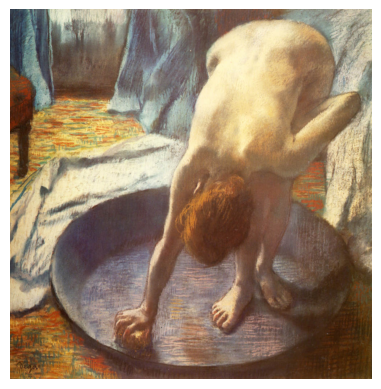

In [ ]:
# Predict from web - this is an image of Titian.
# Replace 'url' with any image of one of the 11 artists above and run this cell.

#url = 'https://www.gpsmycity.com/img/gd/2081.jpg'
url='/content/images/images/Edgar_Degas/Edgar_Degas_10.jpg'
import imageio
import cv2

web_image = imageio.imread(url)
web_image = cv2.resize(web_image, dsize=train_input_shape[0:2], )
#web_image = image.img_to_array(web_image)
web_image = tf.keras.utils.img_to_array(web_image)
web_image /= 255.
web_image = np.expand_dims(web_image, axis=0)


prediction = model.predict(web_image)
prediction_probability = np.amax(prediction)
prediction_idx = np.argmax(prediction)

print("Predicted artist =", labels[prediction_idx].replace('_', ' '))

print("Prediction probability =", prediction_probability*100, "%")

plt.imshow(imageio.imread(url))
plt.axis('off')
plt.show()

In [ ]:
# save model
model.save('model_resnet50_deep_artist_identification.h5')
#To save and load the weights of the model, you would first use
model.save_weights('model_resnet50_deep_artist_identification_weights.h5')

In [ ]:
model.get_weights()

[array([[[[ 2.77831336e-03,  9.16331261e-03, -2.43197642e-02, ...,
            2.00662967e-02, -5.22691496e-02, -5.75413276e-03],
          [-3.96821722e-02,  1.06524415e-01, -5.93669340e-02, ...,
            1.71335302e-02,  1.55756539e-02,  1.32850232e-02],
          [-3.25525366e-02, -2.37061027e-02, -5.98723702e-02, ...,
           -1.20546585e-02,  2.95783505e-02,  6.81423396e-03]],
 
         [[ 1.25565901e-02, -1.89013015e-02, -9.20658838e-03, ...,
            9.01844539e-03, -3.51027702e-03,  1.58998705e-02],
          [-1.91312097e-03,  7.42689446e-02, -5.65211475e-02, ...,
            1.46309687e-02,  1.95028018e-02, -3.29710147e-03],
          [ 5.12775593e-03, -3.19956355e-02, -5.90957515e-02, ...,
           -2.07068305e-02, -2.86506973e-02, -4.17830609e-03]],
 
         [[ 2.99479030e-02, -2.53001582e-02,  2.01566722e-02, ...,
            2.00259183e-02,  1.82911810e-02, -4.54534218e-03],
          [ 3.21643651e-02,  7.15607628e-02, -4.36977819e-02, ...,
            2.392

In [ ]:
model.optimizer

In [ ]:
#to save the weights, as you've displayed. To load the weights, you would first need to build your model,
# and then call load_weights on the model, as in
model.load_weights('deep_artist_identification_weights.h5')

In [ ]:
# Recreate the exact same model, including its weights and the optimizer
#new_model = tf.keras.models.load_model('model_deep_artist_identification.h5')
new_model = tf.keras.models.load_model('/content/model_resnet50_deep_artist_identification.h5')


# Show the model architecture
new_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [ ]:
#new model has the same weight as the previous one
new_model.get_weights()

[array([[[[ 2.77831336e-03,  9.16331261e-03, -2.43197642e-02, ...,
            2.00662967e-02, -5.22691496e-02, -5.75413276e-03],
          [-3.96821722e-02,  1.06524415e-01, -5.93669340e-02, ...,
            1.71335302e-02,  1.55756539e-02,  1.32850232e-02],
          [-3.25525366e-02, -2.37061027e-02, -5.98723702e-02, ...,
           -1.20546585e-02,  2.95783505e-02,  6.81423396e-03]],
 
         [[ 1.25565901e-02, -1.89013015e-02, -9.20658838e-03, ...,
            9.01844539e-03, -3.51027702e-03,  1.58998705e-02],
          [-1.91312097e-03,  7.42689446e-02, -5.65211475e-02, ...,
            1.46309687e-02,  1.95028018e-02, -3.29710147e-03],
          [ 5.12775593e-03, -3.19956355e-02, -5.90957515e-02, ...,
           -2.07068305e-02, -2.86506973e-02, -4.17830609e-03]],
 
         [[ 2.99479030e-02, -2.53001582e-02,  2.01566722e-02, ...,
            2.00259183e-02,  1.82911810e-02, -4.54534218e-03],
          [ 3.21643651e-02,  7.15607628e-02, -4.36977819e-02, ...,
            2.392

In [ ]:
new_model.optimizer

In [ ]:
#prova valutazione modello
predictions=new_model.evaluate(valid_generator)

51/51 [==============================] - 18s 323ms/step - loss: 0.4889 - accuracy: 0.8700


In [ ]:
loss, acc = new_model.evaluate(train_generator, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))
print('Restored model, loss: {:5.2f}%'.format(100 * loss))

204/204 - 62s - loss: 0.0676 - accuracy: 0.9975 - 62s/epoch - 302ms/step
Restored model, accuracy: 99.75%
Restored model, loss:  6.76%


In [ ]:
loss, acc = new_model.evaluate(valid_generator, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))
print('Restored model, loss: {:5.2f}%'.format(100 * loss))

51/51 - 15s - loss: 0.4876 - accuracy: 0.8651 - 15s/epoch - 290ms/step
Restored model, accuracy: 86.51%
Restored model, loss: 48.76%


In [ ]:
# Prediction accuracy on CV data
score = new_model.evaluate_generator(valid_generator, verbose=1)
print("Prediction accuracy on CV data =", score[1])

<ipython-input-40-8821ab500e22>:2: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = new_model.evaluate_generator(valid_generator, verbose=1)


51/51 [==============================] - 15s 302ms/step - loss: 0.4818 - accuracy: 0.8700
Prediction accuracy on CV data = 0.8700494766235352


1/1 [==============================] - 0s 36ms/step


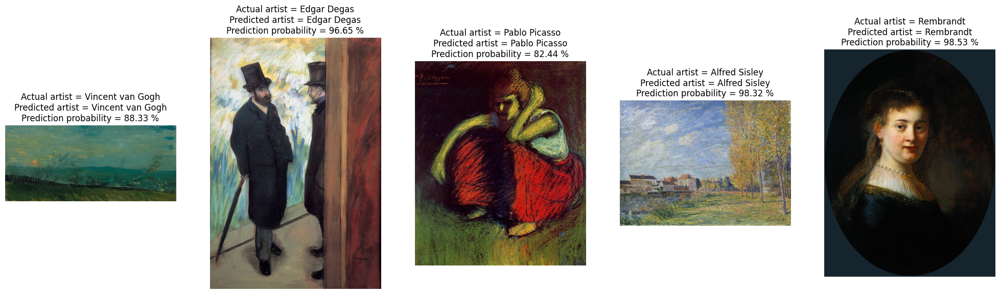

In [ ]:
# PROVA PREDICT Prediction
from keras.preprocessing import *

n = 5
fig, axes = plt.subplots(1, n, figsize=(25,10))

for i in range(n):
    random_artist = random.choice(artists_top_name)
    random_image = random.choice(os.listdir(os.path.join(images_dir, random_artist)))
    random_image_file = os.path.join(images_dir, random_artist, random_image)

    # Original image

    #ERRORE
    #test_image = image.load_img(random_image_file, target_size=(train_input_shape[0:2]))
    test_image = tf.keras.utils.load_img(random_image_file, target_size=(train_input_shape[0:2]))

    # Predict artist
    #test_image = image.img_to_array(test_image)
    test_image = tf.keras.utils.img_to_array(test_image)
    test_image /= 255.
    test_image = np.expand_dims(test_image, axis=0)

    prediction = new_model.predict(test_image)
    prediction_probability = np.amax(prediction)
    prediction_idx = np.argmax(prediction)

    labels = train_generator.class_indices
    labels = dict((v,k) for k,v in labels.items())

    #print("Actual artist =", random_artist.replace('_', ' '))
    #print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
    #print("Prediction probability =", prediction_probability*100, "%")

    title = "Actual artist = {}\nPredicted artist = {}\nPrediction probability = {:.2f} %" \
                .format(random_artist.replace('_', ' '), labels[prediction_idx].replace('_', ' '),
                        prediction_probability*100)


    # Print image
    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

plt.show()

<ipython-input-42-c5cdf500fcb1>:16: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  web_image = imageio.imread(url)


1/1 [==============================] - 0s 24ms/step
Predicted artist = Titian
Prediction probability = 92.78024435043335 %


<ipython-input-42-c5cdf500fcb1>:37: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plt.imshow(imageio.imread(url))


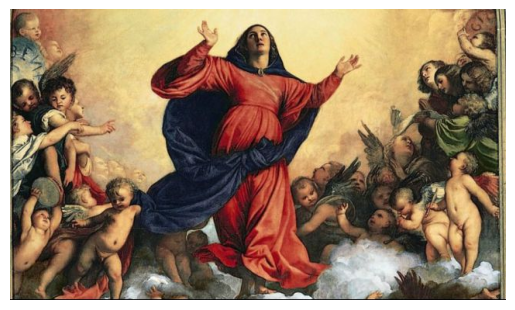

In [ ]:
#prova PREDICT IMAGE

# Predict from web - this is an image of Titian.
# Replace 'url' with any image of one of the 11 artists above and run this cell.

url = 'https://www.gpsmycity.com/img/gd/2081.jpg'
#url = '/content/images/images/Edvard_Munch/Edvard_Munch_10.jpg'
#url='https://b2cfurniture.com.au/pub/media/catalog/product/cache/3fb871f48f7af5e44260f2d9fd3932a9/e/l/elm-modern-hardwood-dining-chair-black-hardwood-frame-eco-friendly-beige-fabric_3_.jpg'


import imageio
import cv2
from keras.preprocessing import image
import keras.utils as image

web_image = imageio.imread(url)
web_image = cv2.resize(web_image, dsize=(train_input_shape[0:2]), )
web_image = image.img_to_array(web_image)
web_image /= 255.
web_image = np.expand_dims(web_image, axis=0)


prediction = new_model.predict(web_image)
prediction_probability = np.amax(prediction)
prediction_idx = np.argmax(prediction)

#prova
if prediction_probability < 60 :

  print("Predicted artist =", labels[prediction_idx].replace('_', ' '))
  print("Prediction probability =", prediction_probability*100, "%")


elif prediction_probability < 60 :
  print("No")

plt.imshow(imageio.imread(url))
plt.axis('off')
plt.show()

In [ ]:
#Another saving technique is model.save(filepath). This save function saves:
#The architecture of the model, allowing to re-create the model.
#The weights of the model.
#The training configuration (loss, optimizer).
#The state of the optimizer, allowing to resume training exactly where you left off.
#To load this saved model, you would use the following:

from keras.models import load_model
new_model = load_model('model_deep_artist_identification.h5')

In [ ]:
#Let model is our "trained model". So we run this code snippets to save our model:
# Load the library
from tensorflow.keras.models import load_model
# Save the model
model.save('model_deep_artist_identification.h5')

In [ ]:
from google.colab import files
files.download('model_deep_artist_identification.h5')

In [ ]:
from google.colab import files
files.download('deep_artist_identification_weights.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#finisce la ram
import tensorflow as tf


#model = tf.keras.models.load_model('/content/gdrive/MyDrive/model_deep_artist_identificationv3.h5')
model = tf.keras.models.load_model('/content/model_resnet50_deep_artist_identification.h5')
converter = tf.lite.TFLiteConverter.from_keras_model(model = model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

#prova
#converter.representative_dataset = tf.lite.RepresentativeDataset(train_generator)

#converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
  tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
]
tflite_model = converter.convert()
open("convtfl_model_resnet50_deep_artist_identification.tflite", "wb").write(tflite_model)

25531656

In [ ]:
from google.colab import files
files.upload()

Saving convtfl_model_resnet50_deep_artist_identification.tflite to convtfl_model_resnet50_deep_artist_identification.tflite


In [ ]:
# Load or define your Keras model
model = tf.keras.models.load_model('/content/gdrive/MyDrive/model_resnet50_deep_artist_identification.h5')

# Get the input shape
input_shape = model.layers[0].input_shape[1:]  # Exclude the batch size

print("Input shape:", input_shape)

Input shape: []


In [ ]:
# Get images and labels batch from validation dataset generator

val_image_batch, val_label_batch = next(iter(valid_generator))
true_label_ids = np.argmax(val_label_batch, axis=-1)

print("Validation batch shape:", val_image_batch.shape)

Validation batch shape: (16, 224, 224, 3)


In [ ]:
artists_top_name

In [ ]:
dataset_labels ="Vincent_van_Gogh",
"Edgar_Degas",
"Pablo_Picasso",
"Pierre-Auguste_Renoir",
"Albrecht_DuтХа├кrer",
"Paul_Gauguin",
"Francisco_Goya",
"Rembrandt",
"Alfred_Sisley",
"Titian",

('Titian',)

In [ ]:
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())
labels

{0: 'Vincent_van_Gogh',
 1: 'Edgar_Degas',
 2: 'Pablo_Picasso',
 3: 'Pierre-Auguste_Renoir',
 4: 'Albrecht_DuтХа├кrer',
 5: 'Paul_Gauguin',
 6: 'Francisco_Goya',
 7: 'Rembrandt',
 8: 'Alfred_Sisley',
 9: 'Titian'}

In [ ]:
model = tf.keras.models.load_model('/content/gdrive/MyDrive/model_resnet50_deep_artist_identification.h5')

In [ ]:
model.output_shape

(None, 10)

In [ ]:
#num of layers
len(model.layers)

180

In [ ]:
# Load your TFLite model
ccinterpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
ccinterpreter.allocate_tensors()

# Get the input and output details
ccinput_details = ccinterpreter.get_input_details()
ccoutput_details = ccinterpreter.get_output_details()

# Modify the input shape to allow for variable batch size
ccinput_details[0]['shape'] = [None, 224, 224, 3]

# Recreate the interpreter with the modified input shape
ccinterpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
ccinterpreter.allocate_tensors()

In [ ]:
# Load your TFLite model
interpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
interpreter.allocate_tensors()

# Get the input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Modify the input shape to allow for variable batch size
input_details[0]['shape'] = [None, 224, 224, 3]

# Reallocate tensors for the modified interpreter
interpreter.allocate_tensors()

In [ ]:
ccinput_details = ccinterpreter.get_input_details()
ccexpected_input_shape = ccinput_details[0]['shape']
print("Expected Input Shape:", ccexpected_input_shape)

Expected Input Shape: [  1 224 224   3]


In [ ]:
# Load your TFLite model
model_path = '/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite'
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Get input and output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Initialize variables to store evaluation results
correct_predictions = 0
total_samples = 0

# Iterate through the validation generator batch by batch
for batch in valid_generator:
    input_data, true_labels = batch


    # Set the input tensor
    #interpreter.set_tensor(input_details[0]['index'], input_data)

    interpreter.resize_tensor_input(input_details[0]['index'], (16, 224, 224, 3))
    interpreter.resize_tensor_input(output_details[0]['index'], (16, 10))
    interpreter.allocate_tensors()

    # Run inference
    interpreter.invoke()

    # Get the model's output
    output_data = interpreter.get_tensor(output_details[0]['index'])

    # Calculate accuracy
    predicted_classes = np.argmax(output_data, axis=1)
    correct_predictions += np.sum(predicted_classes == np.argmax(true_labels, axis=1))

    total_samples += input_data.shape[0]

    # Check if the generator has reached its end
    if total_samples >= len(train_generator):
        break

# Calculate accuracy for the entire validation set
accuracy = correct_predictions / total_samples
print("Validation Accuracy: {:.2f}%".format(accuracy * 100))

Validation Accuracy: 16.83%


In [ ]:
testtfmodel=np.expand_dims(testtfmodel,0).astype(np.float32)
print("input data type:", testtfmodel.dtype)
print("input data shape:",testtfmodel.shape)


input_details = interpreter.get_input_details()
interpreter.set_tensor(input_details[0]['index,'], testtfmodel)


interpreter.invoke()

output_details = interpreter.get_output_details()
output_data=interpreter.get_tensor(output_details[0]['index'])

print("\n\n predict result",output_data)

print("predicted value",np.argmax(output_data))




NameError: ignored

In [ ]:
input_data = np.expand_dims(input_details, axis=0)

In [ ]:

# Load your TFLite model
interpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
interpreter.allocate_tensors()

# Get input details
input_details = interpreter.get_input_details()

# Print input details
print("Input details:")
print(input_details)

Input details:
[{'name': 'serving_default_input_1:0', 'index': 0, 'shape': array([  1, 224, 224,   3], dtype=int32), 'shape_signature': array([ -1, 224, 224,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


In [ ]:
#model = tf.keras.models.load_model('/content/gdrive/MyDrive/model_deep_artist_identificationv3.h5')
model = tf.keras.models.load_model('/content/gdrive/MyDrive/model_resnet50_deep_artist_identification.h5')
converter = tf.lite.TFLiteConverter.from_keras_model(model = model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

new_input_shape = (16, 224, 224, 3)
#prova
#converter.representative_dataset = tf.lite.RepresentativeDataset(train_generator)

#converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]
converter.target_spec.supported_ops = [
  tf.lite.OpsSet.TFLITE_BUILTINS, # enable TensorFlow Lite ops.
  tf.lite.OpsSet.SELECT_TF_OPS # enable TensorFlow ops.
]
tflite_model = converter.convert()
open("convtfl_model_resnet50_deep_artist_identification.tflite", "wb").write(tflite_model)

25531656

In [ ]:
interpreter.resize_tensor_input(input_details[0]['index'], (16, 224, 224, 3))
interpreter.resize_tensor_input(output_details[0]['index'], (16, 10))
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("== Input details ==")
print("name:", input_details[0]['name'])
print("shape:", input_details[0]['shape'])
print("type:", input_details[0]['dtype'])

print("\n== Output details ==")
print("name:", output_details[0]['name'])
print("shape:", output_details[0]['shape'])
print("type:", output_details[0]['dtype'])

== Input details ==
name: serving_default_input_1:0
shape: [ 16 224 224   3]
type: <class 'numpy.float32'>

== Output details ==
name: StatefulPartitionedCall:0
shape: [16 10]
type: <class 'numpy.float32'>


In [ ]:
validation_data=valid_generator

In [ ]:
tflite_interpreter.set_tensor(input_details[0]['index'], val_image_batch)

tflite_interpreter.invoke()

tflite_model_predictions = tflite_interpreter.get_tensor(output_details[0]['index'])
print("Prediction results shape:", tflite_model_predictions.shape)

Prediction results shape: (16, 10)


In [ ]:
# Convert prediction results to Pandas dataframe, for better visualization

tflite_pred_dataframe = pd.DataFrame(tflite_model_predictions)
tflite_pred_dataframe.columns = artists_top_name

print("TFLite prediction results for the first elements")
tflite_pred_dataframe.head()

TFLite prediction results for the first elements


,Vincent_van_Gogh,Edgar_Degas,Pablo_Picasso,Pierre-Auguste_Renoir,Albrecht_DuтХа├кrer,Paul_Gauguin,Francisco_Goya,Rembrandt,Alfred_Sisley,Titian
0,0.952420,0.005626,0.004335,0.003571,0.007507,0.019566,0.000342,0.000082,0.000438,0.006113
1,0.022026,0.002008,0.959839,0.001557,0.003023,0.002157,0.000258,0.003931,0.000748,0.004453
2,0.000355,0.961706,0.011995,0.000476,0.000372,0.000753,0.001534,0.002721,0.000885,0.019202
3,0.000370,0.003631,0.000111,0.003533,0.000050,0.000099,0.967338,0.001549,0.000307,0.023013
4,0.012103,0.001178,0.002903,0.921822,0.008471,0.034243,0.000930,0.007472,0.007019,0.003858


In [ ]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
# Test the TensorFlow Lite model on random input data.
input_shape = input_details[0]['shape']
inputs, outputs = [], []
for _ in range(224):
  input_data = np.array(np.random.random_sample(input_shape), dtype=np.float32)
  interpreter.set_tensor(input_details[0]['index'], input_data)

  interpreter.invoke()
  tflite_results = interpreter.get_tensor(output_details[0]['index'])

  # Test the TensorFlow model on random input data.
  tf_results = model(tf.constant(input_data))
  output_data = np.array(tf_results)

  inputs.append(input_data[0][0])
  outputs.append(output_data[0][0])

Image Shape ( 224 , 224 )
[5.9214176e-04 3.3005963e-03 1.7240511e-04 3.3892968e-03 1.2426871e-03
 1.3982198e-02 3.5765269e-04 3.9630509e-03 9.7029412e-01 2.7057261e-03]
This image most likely belongs to Alfred_Sisley with a 22.61 percent confidence.


<ipython-input-46-3a384eb78bac>:44: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  plt.imshow(imageio.imread(image_url))


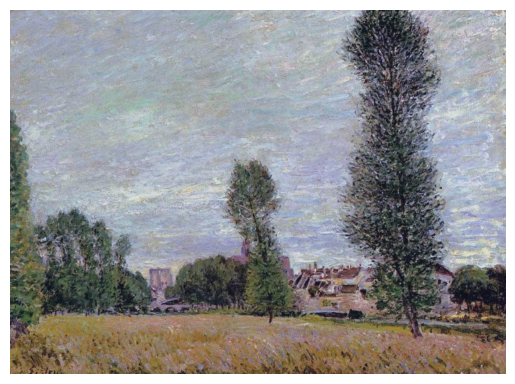

In [ ]:
import itertools, time, os, numpy  as np,sys
from PIL import Image
import tensorflow as tf
import imageio

def lite_model(images):
  interpreter.allocate_tensors()
  interpreter.set_tensor(interpreter.get_input_details()[0]['index'], images)
  interpreter.invoke()
  return interpreter.get_tensor(interpreter.get_output_details()[0]['index'])

class_names = ["Vincent_van_Gogh",
"Edgar_Degas",
"Pablo_Picasso",
"Pierre-Auguste_Renoir",
"Albrecht_DuтХа├кrer",
"Paul_Gauguin",
"Francisco_Goya",
"Rembrandt",
"Alfred_Sisley",
"Titian" ]


interpreter = tf.lite.Interpreter( model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite' )
interpreter.allocate_tensors()
_, height, width, _ = interpreter.get_input_details()[0]['shape']
print("Image Shape (", width, ",", height, ")")

image_url = '/content/images/images/Alfred_Sisley/Alfred_Sisley_239.jpg'
img = tf.keras.preprocessing.image.load_img(image_url, target_size=( width, height ) )
#os.remove(image_url) # Remove the cached file

img_array = tf.keras.preprocessing.image.img_to_array(img)
probs_lite = lite_model( np.expand_dims(img_array, axis=0)/255 )[0]
print ( probs_lite )

label_index= np.argmax(probs_lite)
score = tf.nn.softmax(probs_lite)

print(
  "This image most likely belongs to {} with a {:.2f} percent confidence."
  .format(class_names[label_index], 100 * np.max(score))
)
plt.imshow(imageio.imread(image_url))
plt.axis('off')
plt.show()

In [ ]:
modeltf='convtfl_model_resnet50_deep_artist_identification.tflite'
modeltf

'convtfl_model_resnet50_deep_artist_identification.tflite'

In [ ]:
# Load the TFLite model and allocate tensors. View details
interpreter = tf.lite.Interpreter(model_path='/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
print(interpreter.get_input_details())
print(interpreter.get_output_details())
print(interpreter.get_tensor_details())
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test the model on input data.
input_shape = input_details[0]['shape']
print(input_shape)

# Use same image as Keras model
input_data = np.array(image_a, dtype=np.float32)
interpreter.set_tensor(input_details[0]['index'], input_data)

interpreter.invoke()

# The function `get_tensor()` returns a copy of the tensor data.
# Use `tensor()` in order to get a pointer to the tensor.
output_data = interpreter.get_tensor(output_details[0]['index'])
print(output_data)
print("predic label", artists_top_name)

In [ ]:
from google.colab import files
files.upload()

Saving convtfl_model_resnet50_deep_artist_identification.tflite to convtfl_model_resnet50_deep_artist_identification.tflite


In [ ]:
from google.colab import files
files.download("convtfl_model_resnet50_deep_artist_identification.tflite")

In [ ]:
from keras.models import load_model
new_model = load_model('/content/convtfl_model_resnet50_deep_artist_identification.tflite')

In [ ]:
import pathlib

In [ ]:
tflite_model

In [ ]:
tflite_model_file = pathlib.Path('/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')
tflite_model_file.write_bytes(tflite_model)

In [ ]:
#num of layer
model.layers

In [ ]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_content=tflite_model)
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
# generate .tflite file
#tflite_model = tf.keras.models.load_model('my_model.h5')
#converter = tf.lite.TFLiteConverter.from_keras_model(tflite_model)
#tflite_save = converter.convert()
#open("my_model.tflite", "wb").write(tflite_save)

# Load the TFLite model and allocate tensors. View details
interpreter = tf.lite.Interpreter(model_path="/content/gdrive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite")
print(interpreter.get_input_details())
print(interpreter.get_output_details())
print(interpreter.get_tensor_details())
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test the model on input data.
input_shape = input_details[0]['shape']
print(input_shape)

image_a='/content/images/images/Alfred_Sisley/Alfred_Sisley_1.jpg'

#convert_tensor = transforms.ToTensor()
#convert_tensor(image_a)

# Use same image as Keras model
input_data = np.array(image_a, dtype=np.float32)
interpreter.set_tensor(input_details[0]['index'], input_data)

interpreter.invoke()

# The function `get_tensor()` returns a copy of the tensor data.
# Use `tensor()` in order to get a pointer to the tensor.
output_data = interpreter.get_tensor(output_details[0]['index'])
print(output_data)
# [  1 150 150   3]
# [[0.6071461]]

In [ ]:
import numpy as np
import tensorflow as tf

# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="/content/drive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite")
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test the model on random input data.
input_shape = input_details[0]['shape']
input_data = np.array(np.random.random_sample(input_shape), dtype=np.float32)
interpreter.set_tensor(input_details[0]['index'], input_data)

interpreter.invoke()

# The function `get_tensor()` returns a copy of the tensor data.
# Use `tensor()` in order to get a pointer to the tensor.
output_data = interpreter.get_tensor(output_details[0]['index'])
print(output_data)

[[9.1248828e-01 5.4221093e-03 1.1013209e-02 1.5488300e-02 1.6400142e-02
  1.0185228e-02 8.8683661e-04 6.1789545e-04 1.9463814e-03 2.5551753e-02]]


In [ ]:
from keras.models import load_model
new_model = load_model('/content/drive/MyDrive/convtfl_model_resnet50_deep_artist_identification.tflite')

In [ ]:
loss, acc = new_model.evaluate(train_generator, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))
print('Restored model, loss: {:5.2f}%'.format(100 * loss))

AttributeError: ignored

In [ ]:
loss, acc = new_model.evaluate(valid_generator, verbose=2)
print('Restored model, accuracy: {:5.2f}%'.format(100 * acc))
print('Restored model, loss: {:5.2f}%'.format(100 * loss))

In [ ]:
fid = open ('/content/gdrive/MyDrive/label_deep_artist.txt','r')
count = 0
for line in fid: # treating fid as a sequence of strings
    count = count + 1
    print(line)

print(f"My file has {count} lines.")
fid.close()

{0:'Vincent_van_Gogh',

 1:'Edgar_Degas',

 2:'Pablo_Picasso',

 3:'Pierre-Auguste_Renoir',

 4:'Albrecht_DuтХа├кrer',

 5:'Paul_Gauguin',

 6:'Francisco_Goya',

 7:'Rembrandt',

 8:'Alfred_Sisley',

 9:'Titian',}
My file has 10 lines.
